### Nunivak Sole/Halibut Fishing Exploration

**Question:**

Can we determine a bottom temperature in the kuskokwim relationship to SST to infer information in ideal fishing location about bottom temps

We have some mooring and cruise data we can use to get bottom temps and to compare to SST products

<img src="Kusk_Bay_6.18.20.png" width="400" height="200" />

**SST Data:**
- Daily product (what time of day?)
- OISST V2 (1997-1999 + 2010), Nearest Griddpoint to lat/lon - and Ice Conc
- JPL MUR (low and high res) SST/Ice Conc
- UKmet SST

**Wind Data:**
- NARR (near station) Speed

**CTD Data:**
- BEST data (2010): TN249
- IF CTD data (1997-1999): HX196, HX200, HX209, HX213, ___1999___: (HX220, HX222)

**Moored Data:**
- hourly product (how much daily variability?)
- IF data (1997-1999): 58 40.12 N; 168 19.12 W
- ADCP temp data may also be available but its at 50m depth

**Bycatch Data:**

**Kusk. Bay Test Spot:**


___ToDo___
- clean code... its gotten messy with too many tasks to do.  

### Code prep

In [1]:
from erddapy import ERDDAP
import pandas as pd
import xarray as xa
import datetime
import numpy as np

%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
import cmocean 
import seaborn as sns

import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.io import shapereader
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

In [2]:
#define the basic map projection information and figure size

def make_map(projection=ccrs.PlateCarree()):
    fig, ax = plt.subplots(figsize=(10.5, 10.5),
                           subplot_kw=dict(projection=projection))
    if projection == ccrs.PlateCarree():
        gl = ax.gridlines(draw_labels=True)
        gl.xlabels_top = gl.ylabels_right = False
        gl.xformatter = LONGITUDE_FORMATTER
        gl.yformatter = LATITUDE_FORMATTER
    return fig, ax

#download land mask
# 50m is a good balance between dataset size and land feature resolution
land_50m = cfeature.NaturalEarthFeature('physical', 'land', '50m',
                                        edgecolor='face',
                                        facecolor='1.0')

### Location Specifics

In [3]:
ifpoint=[58.669,180+(180-168.319)]
kpoint=[59.063,180+(180-164.173)]
m2point=[56.867,180+(180-164.05)]

In [4]:
# get bathymetry and add 70m or 50m line
server_url = 'http://akutan.pmel.noaa.gov:8080/erddap/griddap/etopo5'
server_url = 'https://pae-paha.pacioos.hawaii.edu/erddap/griddap/etopo5'
bathy = xa.open_dataset(server_url) 

bathy_sub = bathy.sel(latitude=slice(55,63),longitude=slice(182,202))

### Available HROISST V2.1 Product in Region

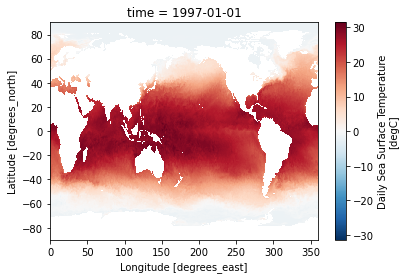

In [5]:
sstfiles = '/Volumes/MobileSSD/in_and_outbox/data_sets/noaa.oisst.v2.highres/'
xdf = xa.load_dataset(sstfiles+'sst.day.mean.1997.v2.nc')
ds = xdf.sel(time=slice("1997-01-01", "1997-01-01"))
ds.sst.plot()

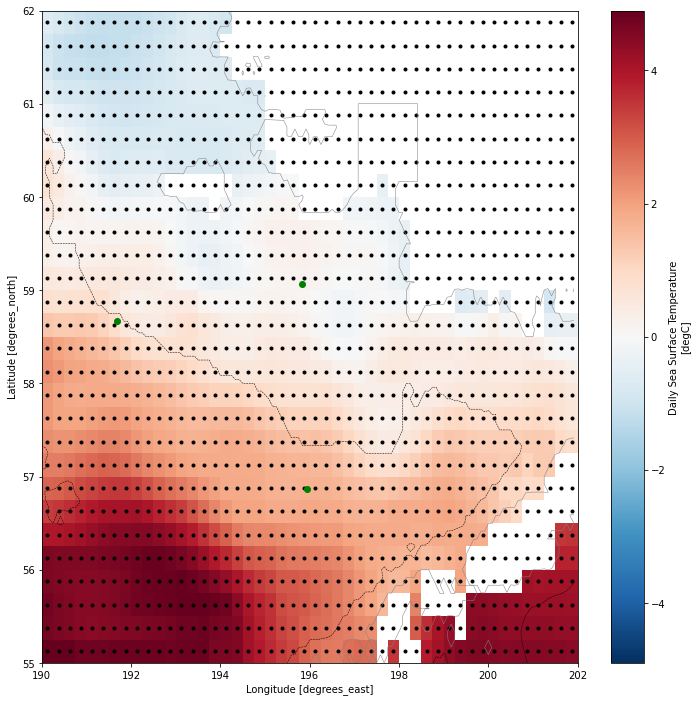

In [6]:
ds = xdf.sel(time=slice("1997-01-01", "1997-01-01"),lat=slice(55,62),lon=slice(190,202))
ds.sst.plot(figsize=(12,12))
ds.plot.scatter(x='lon',y='lat',marker='.',color='k')
plt.scatter(x=ifpoint[1],y=ifpoint[0],marker='o',color='g')
plt.scatter(x=kpoint[1],y=kpoint[0],marker='o',color='g')
plt.scatter(x=m2point[1],y=m2point[0],marker='o',color='g')
#add 50m line
bathy_sub.ROSE.plot.contour(levels=[0,-50],colors=['k','grey'],linewidths=0.5)

### Start with subselecting IF(97-98) moored data (99 is in a different spot)

In [79]:
server_url='http://akutan.pmel.noaa.gov:8080/erddap'

e = ERDDAP(server=server_url)

df = pd.read_csv(e.get_search_url(response='csv', search_for='IF -ADCP -CTD -merged -Drifters -PopUP -ICOADS -12a'))


dfs = {}
for dataset_id in sorted(df['Dataset ID'].values):
    if ('if' in dataset_id) and not ('10' in dataset_id):
        print(dataset_id)
        try:
            e = ERDDAP(server=server_url,
                protocol='tabledap',
                response='csv'
            )
            e.dataset_id=dataset_id
        except HTTPError:
            print('Failed to generate url {}'.format(dataset_id))
            continue
        try:
            dftemp = e.to_pandas(
                                index_col='time (UTC)',
                                parse_dates=True,
                                skiprows=(1,)  # units information can be dropped.
                                )
            dftemp.columns = [x[1].split()[0] for x in enumerate(dftemp.columns)]
            
            ##resample as daily data 
            dfs.update({dataset_id: dftemp})
        except:
            pass

datasets_Met_97ifm1a_final
datasets_Met_98ifm1a_final
datasets_Mooring_97if4a_final
datasets_Mooring_97if5a_final
datasets_Mooring_97if6a_final


/Users/bell/miniconda3/envs/py38/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3361: DtypeWarning: Columns (12) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


datasets_Mooring_97if7a_final
datasets_Mooring_97if8a_final
datasets_Mooring_97if9a_final
datasets_Mooring_97ifm1a_final
datasets_Mooring_97ift2a_final
datasets_Mooring_97ift3a_final
datasets_Mooring_98if4a_final
datasets_Mooring_98if5a_final
datasets_Mooring_98if6a_final
datasets_Mooring_98if7a_final
datasets_Mooring_98if8a_final
datasets_Mooring_98if9a_final
datasets_Mooring_98ifm1a_final
datasets_Mooring_99if2a_final


### And snag M2 as a confidence measure

In [9]:
server_url='http://akutan.pmel.noaa.gov:8080/erddap'

e = ERDDAP(server=server_url)

df = pd.read_csv(e.get_search_url(response='csv', search_for='bsm2'))


dfm2 = {}
for dataset_id in sorted(df['Dataset ID'].values):
    if  not ('gridded' in dataset_id) and not ('Met' in dataset_id) and not ('preliminary' in dataset_id):
        print(dataset_id)
        try:
            e = ERDDAP(server=server_url,
                protocol='tabledap',
                response='csv'
            )
            e.dataset_id=dataset_id
        except HTTPError:
            print('Failed to generate url {}'.format(dataset_id))
            continue
        try:
            dftemp = e.to_pandas(
                                index_col='time (UTC)',
                                parse_dates=True,
                                skiprows=(1,)  # units information can be dropped.
                                )
            dftemp.columns = [x[1].split()[0] for x in enumerate(dftemp.columns)]

            ##resample as daily data 
            dfm2.update({dataset_id: dftemp})
        except:
            pass

datasets_Mooring_00bsm2a_final
datasets_Mooring_01bsm2a_final
datasets_Mooring_02bsm2a_final
datasets_Mooring_03bsm2a_final
datasets_Mooring_04bsm2a_final
datasets_Mooring_05bsm2a_final
datasets_Mooring_06bsm2a_final
datasets_Mooring_07bsm2a_final
datasets_Mooring_08bsm2a_final
datasets_Mooring_09bsm2a_final
datasets_Mooring_09bsp2a_final
datasets_Mooring_10bsm2a_final
datasets_Mooring_11bsm2a_final
datasets_Mooring_12bsm2a_final
datasets_Mooring_13bsm2a_final
datasets_Mooring_14bsm2a_final
datasets_Mooring_15bsm2a_final
datasets_Mooring_16bsm2a_final
datasets_Mooring_17bsm2a_final
datasets_Mooring_18bsm2a_final
datasets_Mooring_19bsm2a_final
datasets_Mooring_95bsm2_final
datasets_Mooring_95bsm2a_final
datasets_Mooring_96bsm2a_final
datasets_Mooring_97bsm2a_final
datasets_Mooring_98bsm2b_final
datasets_Mooring_99bsm2a_final


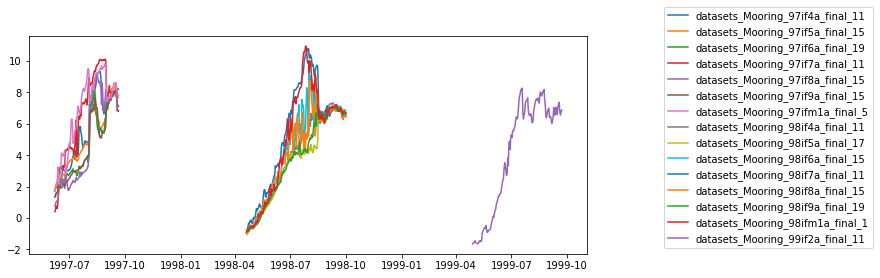

In [80]:
#pull max or min depth from moored data
fig, ax = plt.subplots(figsize=(10, 4))
for dataset_id in sorted(dfs.keys()):
    try:
        btmdepth = min(dfs[dataset_id].groupby('depth').groups.keys())
        if btmdepth <0:
            btmdepth = min(list(dfs[dataset_id].groupby('depth').groups.keys())[1:])

        ax = plt.plot((dfs[dataset_id][dfs[dataset_id].depth == btmdepth]).resample('1D').mean().index,
                      (dfs[dataset_id][dfs[dataset_id].depth == btmdepth])['temperature'].resample('1D').mean(),
                      label=dataset_id+'_'+str(int(btmdepth)))
    except:
        pass

fig.legend(bbox_to_anchor=(1,1), loc="upper left")

### Load SST data and find nearest point

In [85]:
sstfiles = '/Volumes/MobileSSD/in_and_outbox/data_sets/noaa.oisst.v2.highres/'
xdf = xa.open_mfdataset(sstfiles+'sst.day.mean.199[89].v2.nc')
#xdf = xa.open_mfdataset(sstfiles+'sst.day.mean.*.v2.nc')
exdf = xa.open_mfdataset(sstfiles+'sst.day.err.199[8].v2.nc')
ixdf = xa.open_mfdataset(sstfiles+'icec.day.mean.199[8].v2.nc')

In [86]:
ixdf

<xarray.Dataset>
Dimensions:  (lat: 720, lon: 1440, time: 365)
Coordinates:
  * time     (time) datetime64[ns] 1998-01-01 1998-01-02 ... 1998-12-31
  * lat      (lat) float32 -89.88 -89.62 -89.38 -89.12 ... 89.38 89.62 89.88
  * lon      (lon) float32 0.125 0.375 0.625 0.875 ... 359.1 359.4 359.6 359.9
Data variables:
    icec     (time, lat, lon) float32 dask.array<chunksize=(365, 720, 1440), meta=np.ndarray>
Attributes:
    Conventions:    CF-1.5
    title:          NOAA High-resolution Blended Analysis: Daily Values using...
    institution:    NOAA/NCDC
    source:         NOAA/NCDC  ftp://eclipse.ncdc.noaa.gov/pub/OI-daily-v2/
    comment:        Reynolds, et al., 2007: Daily High-Resolution-Blended Ana...
    history:        Thu Aug 24 13:44:02 2017: ncatted -O -a References,global...
    dataset_title:  NOAA Daily Optimum Interpolation Sea Surface Temperature
    References:     https://www.psl.noaa.gov/data/gridded/data.noaa.oisst.v2....

In [87]:
m2df = xdf.sel(lat=m2point[0], lon=m2point[1], method="nearest").load()
mdf = xdf.sel(lat=ifpoint[0], lon=ifpoint[1], method="nearest").load()
kdf = xdf.sel(lat=kpoint[0], lon=kpoint[1], method="nearest").load()

In [88]:
m2dfe = exdf.sel(lat=m2point[0], lon=m2point[1], method="nearest").load()
mdfe = exdf.sel(lat=ifpoint[0], lon=ifpoint[1], method="nearest").load()
kdfe = exdf.sel(lat=kpoint[0], lon=kpoint[1], method="nearest").load()

In [89]:
m2dfi = ixdf.sel(lat=m2point[0], lon=m2point[1], method="nearest").load()
mdfi = ixdf.sel(lat=ifpoint[0], lon=ifpoint[1], method="nearest").load()
kdfi = ixdf.sel(lat=kpoint[0], lon=kpoint[1], method="nearest").load()

In [90]:
mdf.to_dataframe().to_csv('innerfront_oisst.csv')
kdf.to_dataframe().to_csv('kuskikwim_oisst.csv')
mdfe.to_dataframe().to_csv('innerfront_oisst_err.csv')
kdfe.to_dataframe().to_csv('kuskikwim_oisst_err.csv')
mdfi.to_dataframe().to_csv('innerfront_oisst_ice.csv')
kdfi.to_dataframe().to_csv('kuskikwim_oisst_ice.csv')

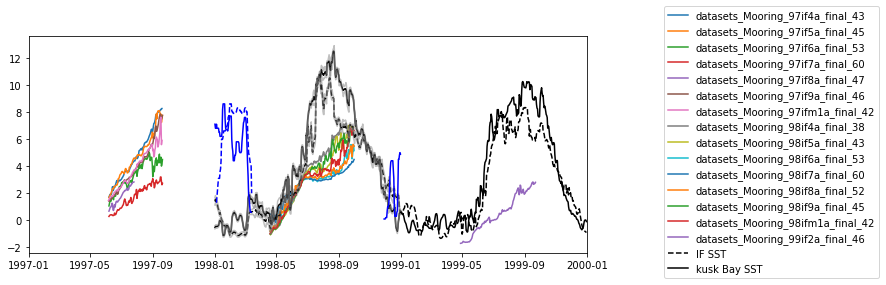

In [91]:
#pull max or min depth from moored data
fig, ax = plt.subplots(figsize=(10, 4))
for dataset_id in sorted(dfs.keys()):
    try:
        btmdepth = max(dfs[dataset_id].groupby('depth').groups.keys())
        if btmdepth <0:
            btmdepth = min(list(dfs[dataset_id].groupby('depth').groups.keys())[1:])
            
        ax = plt.plot((dfs[dataset_id][dfs[dataset_id].depth == btmdepth]).resample('1D').mean().index,
                      (dfs[dataset_id][dfs[dataset_id].depth == btmdepth])['temperature'].resample('1D').mean(),
                      label=dataset_id+'_'+str(int(btmdepth)))

    except:
        pass


ax = plt.plot(mdf.time,mdf.sst,'k--',label='IF SST')
ax = plt.plot(mdfe.time,mdf.sst+mdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(mdfe.time,mdf.sst-mdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(kdf.time,kdf.sst,'k-',label='kusk Bay SST')
ax = plt.plot(kdfe.time,kdf.sst+kdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(kdfe.time,kdf.sst-kdfe.err,'grey',label='',alpha=.5)

ax = plt.plot(mdfi.time,mdfi.icec*10,'b--',label='')
ax = plt.plot(kdfi.time,kdfi.icec*10,'b-',label='')


plt.xlim([datetime.date(1997,1,1),datetime.date(2000,1,1)])

fig.legend(bbox_to_anchor=(1,1), loc="upper left")

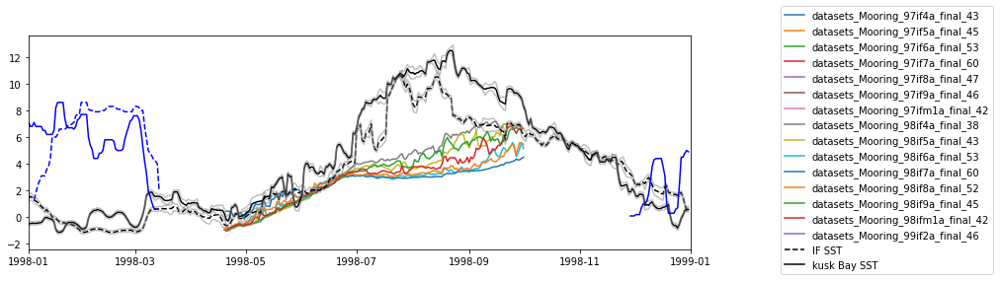

In [82]:
#pull max or min depth from moored data
fig, ax = plt.subplots(figsize=(12, 4))
for dataset_id in sorted(dfs.keys()):
    try:
        btmdepth = max(dfs[dataset_id].groupby('depth').groups.keys())
        if btmdepth <0:
            btmdepth = min(list(dfs[dataset_id].groupby('depth').groups.keys())[1:])
            
        ax = plt.plot((dfs[dataset_id][dfs[dataset_id].depth == btmdepth]).resample('1D').mean().index,
                      (dfs[dataset_id][dfs[dataset_id].depth == btmdepth])['temperature'].resample('1D').mean(),
                      label=dataset_id+'_'+str(int(btmdepth)))

    except:
        pass


ax = plt.plot(mdf.time,mdf.sst,'k--',label='IF SST')
ax = plt.plot(mdfe.time,mdf.sst+mdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(mdfe.time,mdf.sst-mdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(kdf.time,kdf.sst,'k-',label='kusk Bay SST')
ax = plt.plot(kdfe.time,kdf.sst+kdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(kdfe.time,kdf.sst-kdfe.err,'grey',label='',alpha=.5)

ax = plt.plot(mdfi.time,mdfi.icec*10,'b--',label='')
ax = plt.plot(kdfi.time,kdfi.icec*10,'b-',label='')


plt.xlim([datetime.date(1998,1,1),datetime.date(1999,1,1)])

fig.legend(bbox_to_anchor=(1,1), loc="upper left")

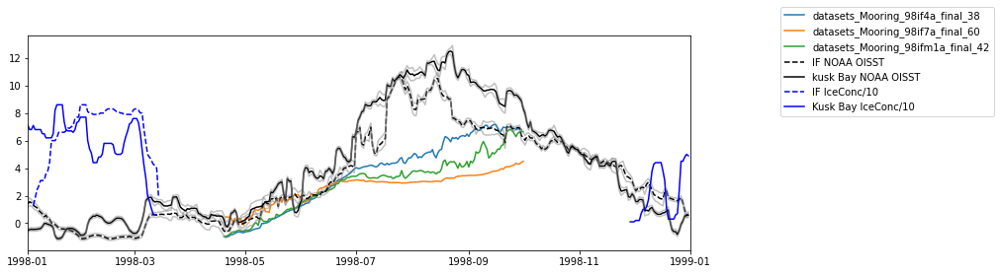

In [76]:
#pull max or min depth from moored data
fig, ax = plt.subplots(figsize=(12, 4))
for dataset_id in sorted(dfs.keys()):
    if ('98if4a' in dataset_id) or ('98ifm1a' in dataset_id) or ('98if7a' in dataset_id):
        try:
            btmdepth = max(dfs[dataset_id].groupby('depth').groups.keys())
            if btmdepth <0:
                btmdepth = min(list(dfs[dataset_id].groupby('depth').groups.keys())[1:])


            ax = plt.plot((dfs[dataset_id][dfs[dataset_id].depth == btmdepth]).resample('1D').mean().index,
                          (dfs[dataset_id][dfs[dataset_id].depth == btmdepth])['temperature'].resample('1D').mean(),
                          label=dataset_id+'_'+str(int(btmdepth)))

        except:
            pass


ax = plt.plot(mdf.time,mdf.sst,'k--',label='IF NOAA OISST')
ax = plt.plot(mdfe.time,mdf.sst+mdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(mdfe.time,mdf.sst-mdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(kdf.time,kdf.sst,'k-',label='kusk Bay NOAA OISST')
ax = plt.plot(kdfe.time,kdf.sst+kdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(kdfe.time,kdf.sst-kdfe.err,'grey',label='',alpha=.5)

ax = plt.plot(mdfi.time,mdfi.icec*10,'b--',label='IF IceConc/10')
ax = plt.plot(kdfi.time,kdfi.icec*10,'b-',label='Kusk Bay IceConc/10')


plt.xlim([datetime.date(1998,1,1),datetime.date(1999,1,1)])

fig.legend(bbox_to_anchor=(1,1), loc="upper left")

(10286.0, 10470.0)

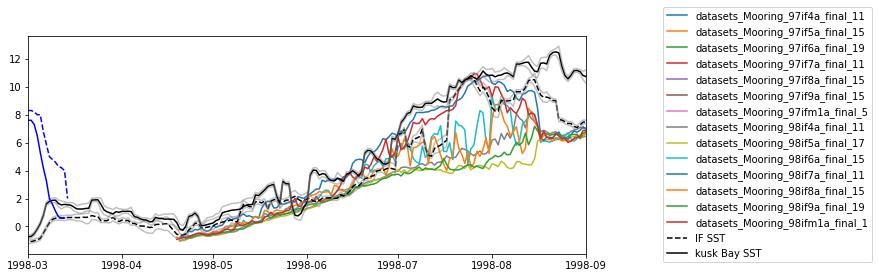

In [60]:
#pull max or min depth from moored data
fig, ax = plt.subplots(figsize=(10, 4))
for dataset_id in sorted(dfs.keys()):
    try:
        btmdepth = min(dfs[dataset_id].groupby('depth').groups.keys())
        if btmdepth <0:
            btmdepth = min(list(dfs[dataset_id].groupby('depth').groups.keys())[1:])
            
        ax = plt.plot((dfs[dataset_id][dfs[dataset_id].depth == btmdepth]).resample('1D').mean().index,
                      (dfs[dataset_id][dfs[dataset_id].depth == btmdepth])['temperature'].resample('1D').mean(),
                      label=dataset_id+'_'+str(int(btmdepth)))

    except:
        pass


ax = plt.plot(mdf.time,mdf.sst,'k--',label='IF SST')
ax = plt.plot(mdfe.time,mdf.sst+mdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(mdfe.time,mdf.sst-mdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(kdf.time,kdf.sst,'k-',label='kusk Bay SST')
ax = plt.plot(kdfe.time,kdf.sst+kdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(kdfe.time,kdf.sst-kdfe.err,'grey',label='',alpha=.5)

ax = plt.plot(mdfi.time,mdfi.icec*10,'b--',label='')
ax = plt.plot(kdfi.time,kdfi.icec*10,'b-',label='')


#plt.xlim([datetime.date(1998,3,1),datetime.date(1998,9,1)])

fig.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xlim([datetime.date(1998,3,1),datetime.date(1998,9,1)])


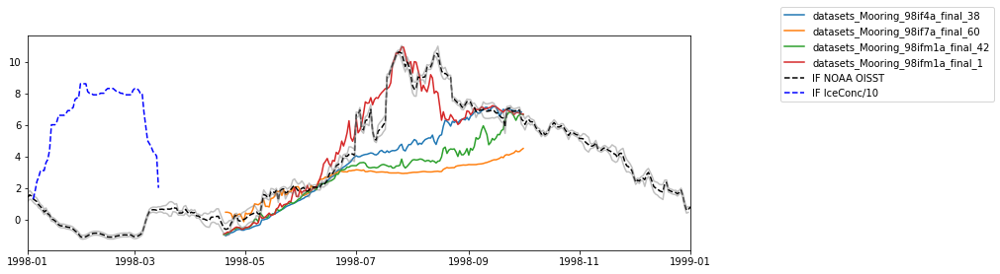

In [94]:
#pull max or min depth from moored data
fig, ax = plt.subplots(figsize=(12, 4))
for dataset_id in sorted(dfs.keys()):
    if ('98if4a' in dataset_id) or ('98ifm1a' in dataset_id) or ('98if7a' in dataset_id):
        try:
            btmdepth = max(dfs[dataset_id].groupby('depth').groups.keys())
            if btmdepth <0:
                btmdepth = min(list(dfs[dataset_id].groupby('depth').groups.keys())[1:])

            ax = plt.plot((dfs[dataset_id][dfs[dataset_id].depth == btmdepth]).resample('1D').mean().index,
                          (dfs[dataset_id][dfs[dataset_id].depth == btmdepth])['temperature'].resample('1D').mean(),
                          label=dataset_id+'_'+str(int(btmdepth)))

        except:
            pass
    if ('98ifm1a' in dataset_id):
        try:
            btmdepth = min(dfs[dataset_id].groupby('depth').groups.keys())
            if btmdepth <0:
                btmdepth = min(list(dfs[dataset_id].groupby('depth').groups.keys())[1:])

            ax = plt.plot((dfs[dataset_id][dfs[dataset_id].depth == btmdepth]).resample('1D').mean().index,
                          (dfs[dataset_id][dfs[dataset_id].depth == btmdepth])['temperature'].resample('1D').mean(),
                          label=dataset_id+'_'+str(int(btmdepth)))

        except:
            pass

ax = plt.plot(mdf.time,mdf.sst,'k--',label='IF NOAA OISST')
ax = plt.plot(mdfe.time,mdf.sst+mdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(mdfe.time,mdf.sst-mdfe.err,'grey',label='',alpha=.5)

ax = plt.plot(mdfi.time,mdfi.icec*10,'b--',label='IF IceConc/10')


plt.xlim([datetime.date(1998,1,1),datetime.date(1999,1,1)])

fig.legend(bbox_to_anchor=(1,1), loc="upper left")

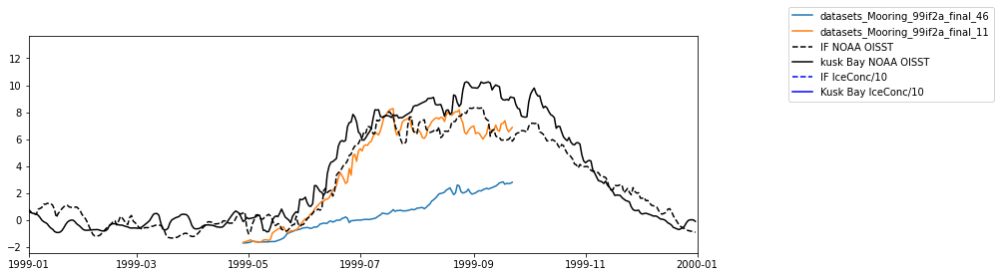

In [92]:
#pull max or min depth from moored data
fig, ax = plt.subplots(figsize=(12, 4))
for dataset_id in sorted(dfs.keys()):
    if ('99if' in dataset_id):
        try:
            btmdepth = max(dfs[dataset_id].groupby('depth').groups.keys())
            if btmdepth <0:
                btmdepth = min(list(dfs[dataset_id].groupby('depth').groups.keys())[1:])

            ax = plt.plot((dfs[dataset_id][dfs[dataset_id].depth == btmdepth]).resample('1D').mean().index,
                          (dfs[dataset_id][dfs[dataset_id].depth == btmdepth])['temperature'].resample('1D').mean(),
                          label=dataset_id+'_'+str(int(btmdepth)))

        except:
            pass
    if ('99if' in dataset_id):
        try:
            btmdepth = min(dfs[dataset_id].groupby('depth').groups.keys())
            if btmdepth <0:
                btmdepth = min(list(dfs[dataset_id].groupby('depth').groups.keys())[1:])

            ax = plt.plot((dfs[dataset_id][dfs[dataset_id].depth == btmdepth]).resample('1D').mean().index,
                          (dfs[dataset_id][dfs[dataset_id].depth == btmdepth])['temperature'].resample('1D').mean(),
                          label=dataset_id+'_'+str(int(btmdepth)))

        except:
            pass

ax = plt.plot(mdf.time,mdf.sst,'k--',label='IF NOAA OISST')
ax = plt.plot(mdfe.time,mdf.sst+mdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(mdfe.time,mdf.sst-mdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(kdf.time,kdf.sst,'k-',label='kusk Bay NOAA OISST')
ax = plt.plot(kdfe.time,kdf.sst+kdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(kdfe.time,kdf.sst-kdfe.err,'grey',label='',alpha=.5)

ax = plt.plot(mdfi.time,mdfi.icec*10,'b--',label='IF IceConc/10')
ax = plt.plot(kdfi.time,kdfi.icec*10,'b-',label='Kusk Bay IceConc/10')


plt.xlim([datetime.date(1999,1,1),datetime.date(2000,1,1)])

fig.legend(bbox_to_anchor=(1,1), loc="upper left")

(9921.0, 10835.0)

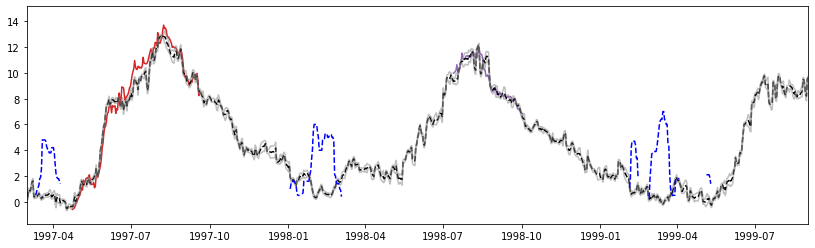

In [21]:
#pull max or min depth from moored data
fig, ax = plt.subplots(figsize=(14, 4))
for dataset_id in sorted(dfm2.keys()):
    try:
        btmdepth = min(dfm2[dataset_id].groupby('depth').groups.keys())
        if btmdepth <0:
            btmdepth = min(list(dfm2[dataset_id].groupby('depth').groups.keys())[1:])
            
        ax = plt.plot((dfm2[dataset_id][dfm2[dataset_id].depth == btmdepth]).resample('1D').mean().index,
                      (dfm2[dataset_id][dfm2[dataset_id].depth == btmdepth])['temperature'].resample('1D').mean(),
                      label=dataset_id+'_'+str(int(btmdepth)))

    except:
        pass


ax = plt.plot(m2df.time,m2df.sst,'k--',label='M2 SST')
ax = plt.plot(m2dfe.time,m2df.sst+m2dfe.err,'grey',label='',alpha=.5)
ax = plt.plot(m2dfe.time,m2df.sst-m2dfe.err,'grey',label='',alpha=.5)


ax = plt.plot(mdfi.time,m2dfi.icec*10,'b--',label='')

#fig.legend(bbox_to_anchor=(1,1), loc="upper left")
plt.xlim([datetime.date(1997,3,1),datetime.date(1999,9,1)])


### Get Regional CTD data from HX cruises

In [18]:
server_url='http://akutan.pmel.noaa.gov:8080/erddap'

e = ERDDAP(server=server_url)

df = pd.read_csv(e.get_search_url(response='csv', search_for='CTD hx'))
df['Dataset ID']

0    CTD_hx196_final
1    CTD_hx200_final
2    CTD_hx209_final
3    CTD_hx213_final
4    CTD_hx220_final
5    CTD_hx222_final
Name: Dataset ID, dtype: object

In [19]:
dfc = {}
for dataset_id in sorted(df['Dataset ID'].values):

    print(dataset_id)
    try:
        e = ERDDAP(server=server_url,
            protocol='tabledap',
            response='csv'
        )
        e.dataset_id=dataset_id
    except HTTPError:
        print('Failed to generate url {}'.format(dataset_id))
        continue
    try:
        dftemp = e.to_pandas(
                            index_col='time (UTC)',
                            parse_dates=True,
                            skiprows=(1,)  # units information can be dropped.
                            )
        dftemp.columns = [x[1].split()[0] for x in enumerate(dftemp.columns)]

        ##resample as daily data 
        dfc.update({dataset_id: dftemp})
    except:
        pass

CTD_hx196_final


/Users/bell/miniconda3/envs/py38/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3357: DtypeWarning: Columns (23) have mixed types.Specify dtype option on import or set low_memory=False.
  if (await self.run_code(code, result,  async_=asy)):


CTD_hx200_final
CTD_hx209_final
CTD_hx213_final
CTD_hx220_final
CTD_hx222_final


In [20]:
#get minimum for each cast
sfcdata = pd.DataFrame()
btmdata = pd.DataFrame()
for dataset_id in sorted(dfc.keys()):
    for dive in dfc[dataset_id].groupby('profile_id').groups:
        sfcdata = pd.concat([sfcdata,dfc[dataset_id].groupby('profile_id').get_group(dive).iloc[0]],axis=1)
        btmdata = pd.concat([btmdata,dfc[dataset_id].groupby('profile_id').get_group(dive).iloc[-1]],axis=1)

sfcdata=sfcdata.transpose()
btmdata=btmdata.transpose()

In [21]:
dfc['CTD_hx196_final'].keys()

Index(['pressure', 'latitude', 'longitude', 'BTL_103', 'S_42', 'S_41', 'ST_70',
       'fWS_973', 'T_28', 'T_20', 'OST_62', 'O_65', 'T2_35', 'Tr_904',
       'PAR_905', 'profile_id', 'Instrument_Identifier', 'Water_Depth',
       'air_pressure_at_sealevel', 'wind_direction', 'wind_speed',
       'air_temperature', 'Station_Name'],
      dtype='object')

In [22]:
shallowsfc = sfcdata[sfcdata['Water_Depth'] <=75]
shallowbrm = btmdata[btmdata['Water_Depth'] <=75]

In [23]:
shallowsfc.to_csv('data/hx_shallowsfc.csv')
shallowbrm.to_csv('data/hx_shallowbtm.csv')

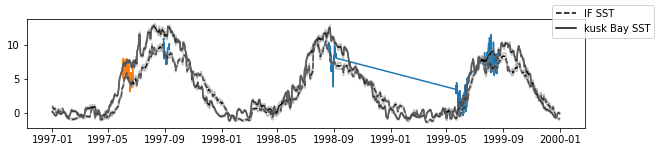

In [24]:
fig, ax = plt.subplots(figsize=(10, 2))
plt.plot(shallowsfc.index,shallowsfc.T_28)
plt.plot(shallowsfc.index,shallowsfc.T_20)
#plt.plot(shallowbrm.index,shallowbrm.T_28)


ax = plt.plot(mdf.time,mdf.sst,'k--',label='IF SST')
ax = plt.plot(mdfe.time,mdf.sst+mdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(mdfe.time,mdf.sst-mdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(kdf.time,kdf.sst,'k-',label='kusk Bay SST')
ax = plt.plot(kdfe.time,kdf.sst+kdfe.err,'grey',label='',alpha=.5)
ax = plt.plot(kdfe.time,kdf.sst-kdfe.err,'grey',label='',alpha=.5)  
fig.legend()

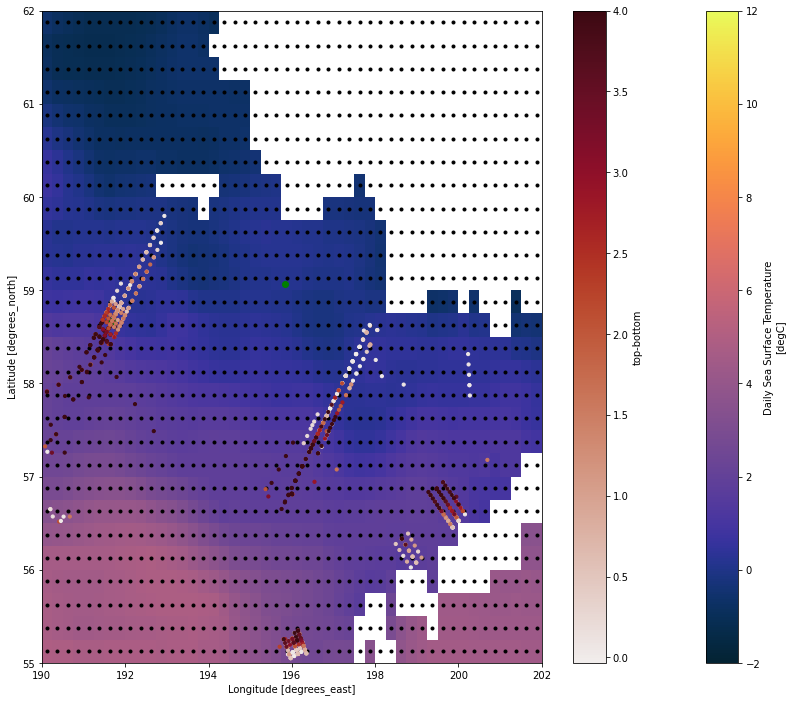

In [25]:
ds = xdf.sel(time=slice("1997-01-01", "1997-01-01"),lat=slice(55,62),lon=slice(190,202))
ds.sst.plot(figsize=(14,12),cmap=cmocean.cm.thermal,vmax=12,vmin=-2)
ds.plot.scatter(x='lon',y='lat',marker='.',color='k')
plt.scatter(x=ifpoint[1],y=ifpoint[0],marker='o',color='g')
plt.scatter(x=kpoint[1],y=kpoint[0],marker='o',color='g')
cm = plt.scatter(x=shallowsfc.longitude,y=shallowsfc.latitude,c=(shallowsfc.T_28-shallowbrm.T_28),s=10,cmap=cmocean.cm.amp,vmax=4)
cm = plt.scatter(x=shallowsfc.longitude,y=shallowsfc.latitude,c=(shallowsfc.T_20-shallowbrm.T_20),s=10,cmap=cmocean.cm.amp,vmax=4)
plt.colorbar(label='top-bottom',)

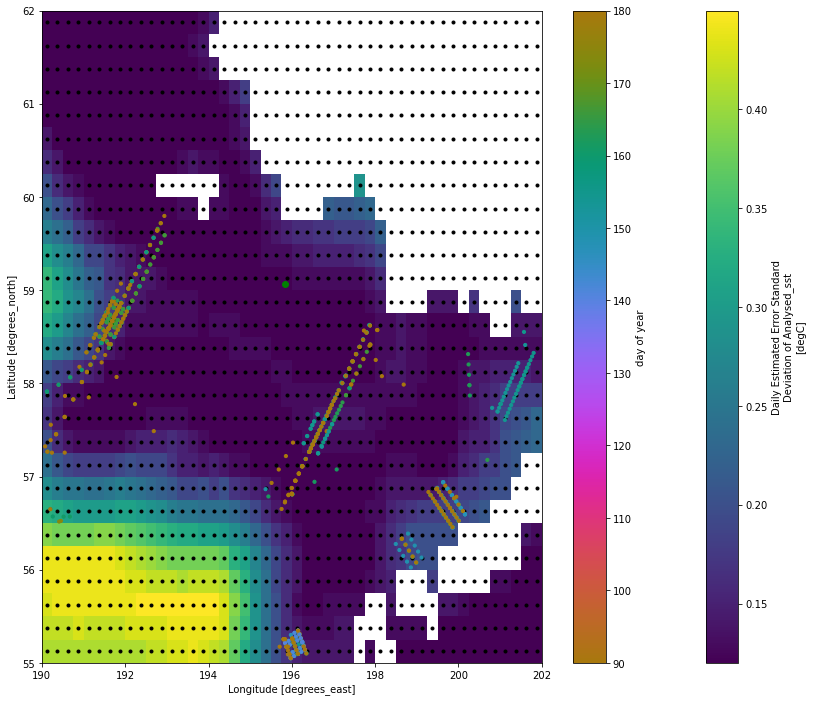

In [26]:
ds = exdf.sel(time=slice("1997-01-01", "1997-01-01"),lat=slice(55,62),lon=slice(190,202))
ds.err.plot(figsize=(14,12))
ds.plot.scatter(x='lon',y='lat',marker='.',color='k')
plt.scatter(x=ifpoint[1],y=ifpoint[0],marker='o',color='g')
plt.scatter(x=kpoint[1],y=kpoint[0],marker='o',color='g')
cm = plt.scatter(x=shallowsfc.longitude,y=shallowsfc.latitude,c=(shallowsfc.index.dayofyear),s=10,cmap=cmocean.cm.phase, vmin=90,vmax=180)
plt.colorbar(label='day of year')

### Get 1day SST window around each ctd

In [27]:
ctddata = pd.DataFrame()
for i,rows in shallowsfc.iterrows():
    ctdtime = i.date().strftime('%Y-%m-%d')
    x = xdf.sel(lat=rows.latitude, lon=rows.longitude, time=i.date().strftime('%Y-%m-%d'), method="nearest")
    icx = ixdf.sel(lat=rows.latitude, lon=rows.longitude, time=i.date().strftime('%Y-%m-%d'), method="nearest")
    tdf = pd.DataFrame([[ctdtime,rows.T_20,shallowbrm.loc[i].T_20,rows.T_28,shallowbrm.loc[i].T_28,rows.latitude,rows.longitude,x.sst.values,icx.icec.values]])
    ctddata=pd.concat([ctddata,
                       tdf],
                                            axis=0)
ctddata.columns = ['date','T_20 top','T_20 btm','T_28 top','T_28 btm','lat','lon','SST','IceC']    
ctddata.reset_index(inplace=True)

In [28]:
ctddata

,index,date,T_20 top,T_20 btm,T_28 top,T_28 btm,lat,lon,SST,IceC
0,0,1997-06-01,5.1783,5.1592,NaN,NaN,55.095000,196.14333,7.5,nan
1,0,1997-06-01,5.3460,4.9096,NaN,NaN,55.136665,196.11000,7.5,nan
2,0,1997-06-01,6.1870,4.1003,NaN,NaN,55.178333,196.07500,7.5,nan
3,0,1997-06-01,6.7794,3.8642,NaN,NaN,55.218334,196.04666,7.5,nan
4,0,1997-06-02,6.6568,3.3576,NaN,NaN,55.258335,196.01334,7.809999942779541,nan
...,...,...,...,...,...,...,...,...,...,...
1105,0,1999-08-18,NaN,NaN,6.7701,6.6602,54.017166,193.97500,8.199999809265137,nan
1106,0,1999-08-18,NaN,NaN,6.8496,6.7095,53.987500,194.08300,8.670000076293945,nan
1107,0,1999-08-19,NaN,NaN,6.7019,6.446,54.046000,193.86867,7.039999961853027,nan
1108,0,1999-08-19,NaN,NaN,6.6675,5.0035,54.082500,193.74167,6.869999885559082,nan


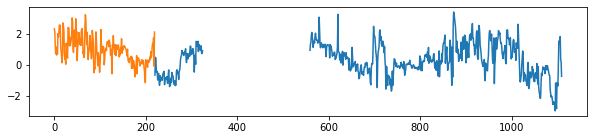

In [29]:
fig, ax = plt.subplots(figsize=(10, 2))
plt.plot(ctddata.index,(ctddata['SST']-ctddata['T_28 top']))
plt.plot(ctddata.index,(ctddata['SST']-ctddata['T_20 top']))

In [30]:
ctddata = pd.DataFrame()
for i,rows in shallowsfc.iterrows():
    ctdtime = i.date().strftime('%Y-%m-%d')
    x = xdf.sel(lat=rows.latitude, lon=rows.longitude, time=i.date().strftime('%Y-%m-%d'), method="nearest")
    icx = ixdf.sel(lat=rows.latitude, lon=rows.longitude, time=i.date().strftime('%Y-%m-%d'), method="nearest")
    tdf = pd.DataFrame([[ctdtime,rows.T_20,shallowbrm.loc[i].T_20,rows.T_28,shallowbrm.loc[i].T_28,rows.latitude,rows.longitude,x.sst.values,icx.icec.values]])
    ctddata=pd.concat([ctddata,
                       tdf],
                                            axis=0)
ctddata.columns = ['date','T_20 top','T_20 btm','T_28 top','T_28 btm','lat','lon','SST','IceC']    
ctddata.reset_index(inplace=True)

In [31]:
ctddata.to_csv('test.csv')

## BEST CTD Data (TN)

In [32]:
server_url='http://akutan.pmel.noaa.gov:8080/erddap'

e = ERDDAP(server=server_url)

df = pd.read_csv(e.get_search_url(response='csv', search_for='CTD tn250'))
df['Dataset ID']

dfb = {}
for dataset_id in sorted(df['Dataset ID'].values):

    print(dataset_id)
    try:
        e = ERDDAP(server=server_url,
            protocol='tabledap',
            response='csv'
        )
        e.dataset_id=dataset_id
    except HTTPError:
        print('Failed to generate url {}'.format(dataset_id))
        continue
    try:
        dftemp = e.to_pandas(
                            index_col='time (UTC)',
                            parse_dates=True,
                            skiprows=(1,)  # units information can be dropped.
                            )
        dftemp.columns = [x[1].split()[0] for x in enumerate(dftemp.columns)]

        ##resample as daily data 
        dfb.update({dataset_id: dftemp})
    except:
        pass

CTD_tn250_final


In [33]:
#get minimum for each cast
sfcdata = pd.DataFrame()
btmdata = pd.DataFrame()
for dataset_id in sorted(dfb.keys()):
    for dive in dfb[dataset_id].groupby('profile_id').groups:
        sfcdata = pd.concat([sfcdata,dfb[dataset_id].groupby('profile_id').get_group(dive).iloc[0]],axis=1)
        btmdata = pd.concat([btmdata,dfb[dataset_id].groupby('profile_id').get_group(dive).iloc[-1]],axis=1)

sfcdata=sfcdata.transpose()
btmdata=btmdata.transpose()

In [34]:
dfb['CTD_tn250_final'].keys()

Index(['pressure', 'latitude', 'longitude', 'BTL_103', 'S_42', 'S_41', 'ST_70',
       'fWS_973', 'T_28', 'OST_62', 'O_65', 'T2_35', 'Tr_904', 'PAR_905',
       'profile_id', 'Instrument_Identifier', 'Water_Depth',
       'air_pressure_at_sealevel', 'wind_direction', 'wind_speed',
       'air_temperature', 'Station_Name'],
      dtype='object')

In [35]:
shallowsfc = sfcdata[sfcdata['Water_Depth'] <=75]
shallowbrm = btmdata[btmdata['Water_Depth'] <=75]

In [36]:
shallowsfc.to_csv('data/tn_shallowsfc.csv')
shallowbrm.to_csv('data/tn_shallowbtm.csv')

In [7]:
#noaa oisst
sstfiles = '/Volumes/MobileSSD/in_and_outbox/data_sets/noaa.oisst.v2.highres/'
xdf = xa.load_dataset(sstfiles+'sst.day.mean.2010.v2.nc')
ixdf = xa.load_dataset(sstfiles+'icec.day.mean.2010.v2.nc')

In [8]:
#mur files
sstfiles = '/Volumes/MobileSSD/in_and_outbox/data_sets/podaac_MUR/SEBering/'
mdf = xa.open_mfdataset(sstfiles+'2010*.nc')

In [9]:
#mur files
sstfiles = '/Volumes/MobileSSD/in_and_outbox/data_sets/podaac_MUR/SEBering_highres/'
mdf_hres = xa.open_mfdataset(sstfiles+'2010*.nc')

In [10]:
#ukmo files
sstfiles = '/Volumes/MobileSSD/in_and_outbox/data_sets/podaac_ukmo/'
ukdf_hres = xa.open_mfdataset(sstfiles+'2010*.nc')

In [42]:
ctddata = pd.DataFrame()
for i,rows in shallowsfc.iterrows():
    ctdtime = i.date().strftime('%Y-%m-%d')
    x = xdf.sel(lat=rows.latitude, lon=rows.longitude, time=i.date().strftime('%Y-%m-%d'), method="nearest")
    icx = ixdf.sel(lat=rows.latitude, lon=rows.longitude, time=i.date().strftime('%Y-%m-%d'), method="nearest")
    mx = mdf.sel(lat=rows.latitude, lon=-1*(180+(180-rows.longitude)), time=i.date().strftime('%Y-%m-%d'), method="nearest")
    mxh = mdf_hres.sel(lat=rows.latitude, lon=-1*(180+(180-rows.longitude)), time=i.date().strftime('%Y-%m-%d'), method="nearest")
    tdf = pd.DataFrame([[ctdtime,rows.T_28,shallowbrm.loc[i].T_28,rows.latitude,
                         rows.longitude,x.sst.values,icx.icec.values,mx.analysed_sst.values[0]-273.15,mxh.analysed_sst.values[0]-273.15]])
    ctddata=pd.concat([ctddata,
                       tdf],
                                            axis=0)
ctddata.columns = ['date','T_28 top','T_28 btm','lat','lon','SST','IceC','MURSST','MURSSThres']    
ctddata.reset_index(inplace=True)

In [43]:
bdf = xdf.sel(lat=m2point[0], lon=m2point[1], method="nearest").load()

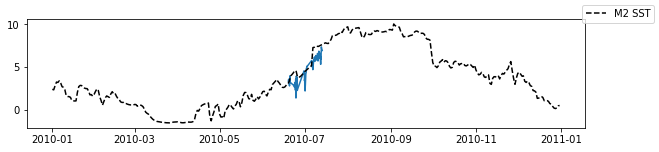

In [44]:
fig, ax = plt.subplots(figsize=(10, 2))
plt.plot(shallowsfc.index,shallowsfc.T_28)


ax = plt.plot(bdf.time,bdf.sst,'k--',label='M2 SST')
#ax = plt.plot(mdfe.time,mdf.sst+mdfe.err,'grey',label='',alpha=.5)
#ax = plt.plot(mdfe.time,mdf.sst-mdfe.err,'grey',label='',alpha=.5)

fig.legend()

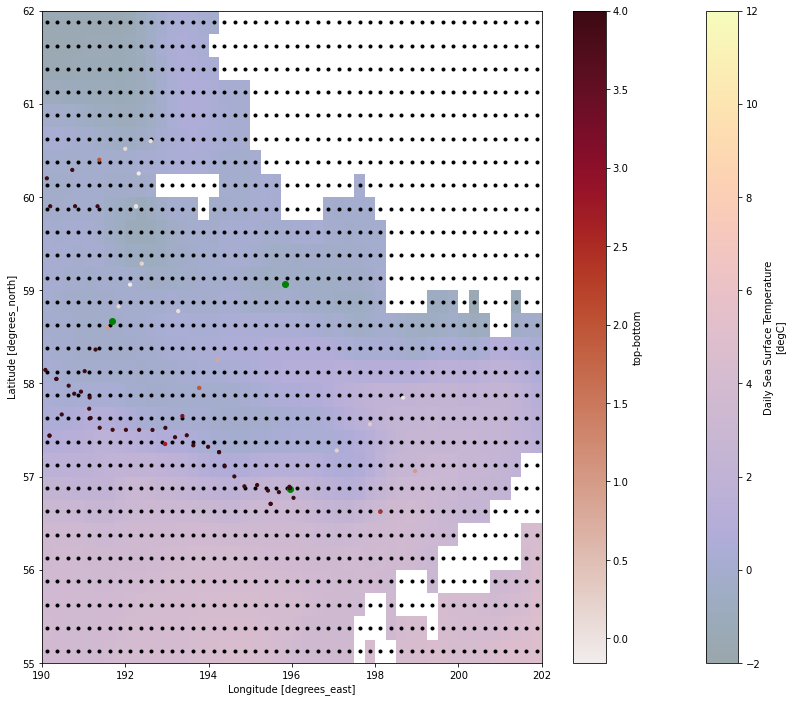

In [45]:
ds = xdf.sel(time=slice("2010-01-01", "2010-01-01"),lat=slice(55,62),lon=slice(190,202))
ds.sst.plot(figsize=(14,12),cmap=cmocean.cm.thermal,vmax=12,vmin=-2,alpha=0.4)
ds.plot.scatter(x='lon',y='lat',marker='.',color='k')
plt.scatter(x=ifpoint[1],y=ifpoint[0],marker='o',color='g')
plt.scatter(x=kpoint[1],y=kpoint[0],marker='o',color='g')
plt.scatter(x=m2point[1],y=m2point[0],marker='o',color='g')
cm = plt.scatter(x=shallowsfc.longitude,y=shallowsfc.latitude,c=(shallowsfc.T_28-shallowbrm.T_28),s=10,cmap=cmocean.cm.amp,vmax=4)
plt.colorbar(label='top-bottom',)

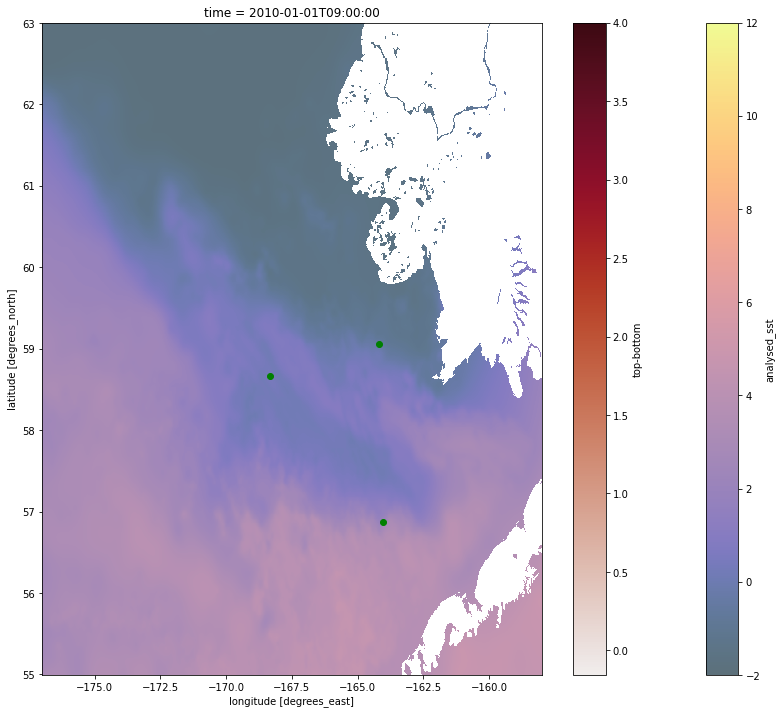

In [46]:
ds = mdf_hres.sel(time=slice("2010-01-01", "2010-01-01"),lat=slice(55,63),lon=slice(-177,-158))
(ds['analysed_sst']-273.15).plot(figsize=(14,12),cmap=cmocean.cm.thermal,vmax=12,vmin=-2,alpha=0.65)
#ds.plot.scatter(x='lon',y='lat',marker='.',color='k')
plt.scatter(x=-1*(360-ifpoint[1]),y=ifpoint[0],marker='o',color='g')
plt.scatter(x=-1*(360-kpoint[1]),y=kpoint[0],marker='o',color='g')
plt.scatter(x=-1*(360-m2point[1]),y=m2point[0],marker='o',color='g')
cm = plt.scatter(x=shallowsfc.longitude,y=shallowsfc.latitude,c=(shallowsfc.T_28-shallowbrm.T_28),s=10,cmap=cmocean.cm.amp,vmax=4)
plt.colorbar(label='top-bottom',)

Text(0, 0.5, 'Temperature')

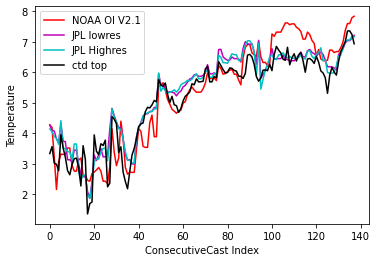

In [47]:
ctddata.SST.astype(float).plot(color='r',label='NOAA OI V2.1')
ctddata.MURSST.astype(float).plot(color='m',label='JPL lowres')
ctddata.MURSSThres.astype(float).plot(color='c',label='JPL Highres')
ctddata['T_28 top'].astype(float).plot(color='k',label='ctd top')
plt.legend()
plt.xlabel('ConsecutiveCast Index')
plt.ylabel('Temperature')

Q:  why is there such a gap between pts 50 and 100 in the two models?  Lets find out the date range and pick an example to plot

2010-07-06 : 2010-07-10

So lets plot the 7th

A:  Seems it was likely due to the points being outside my downloaded model grid-bounds

<ipython-input-48-e22b058ed6ce>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(2,3,figsize=(15, 10))


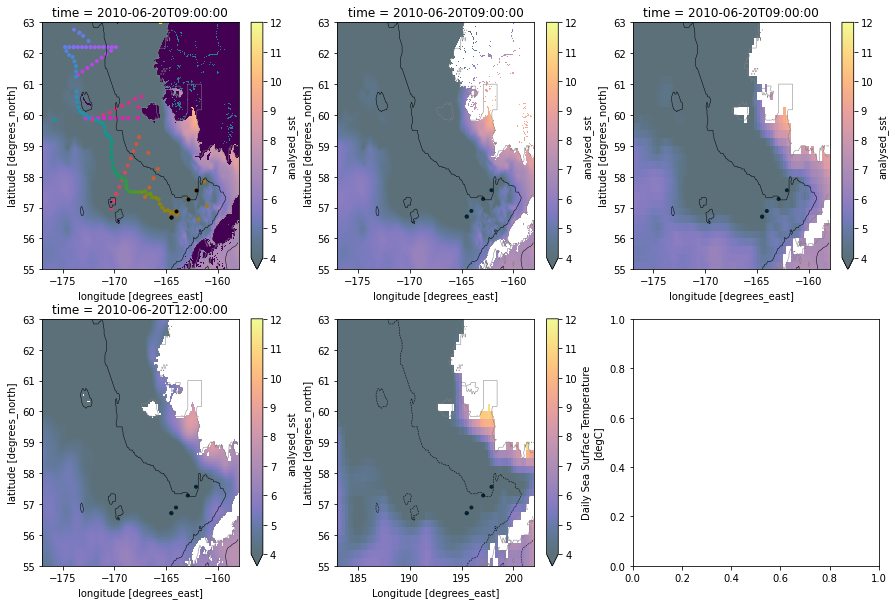

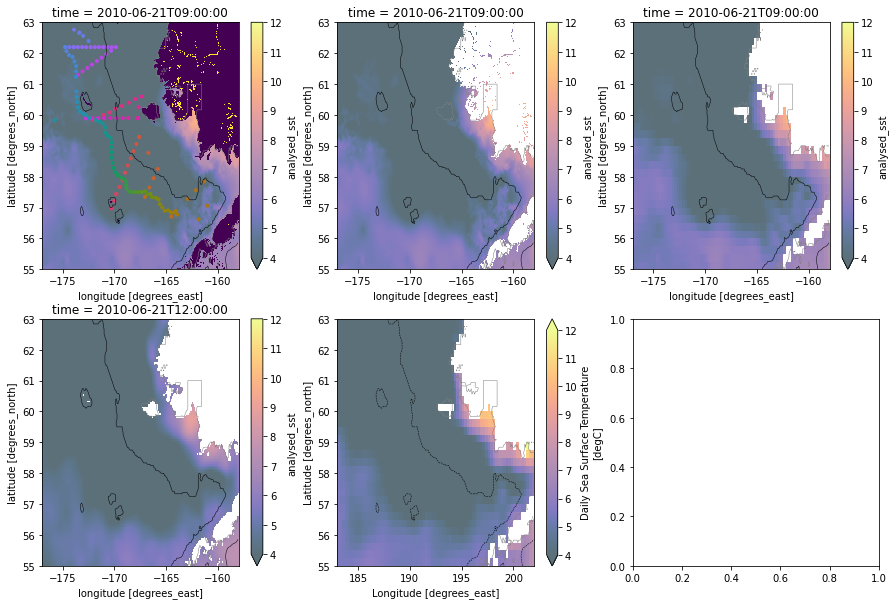

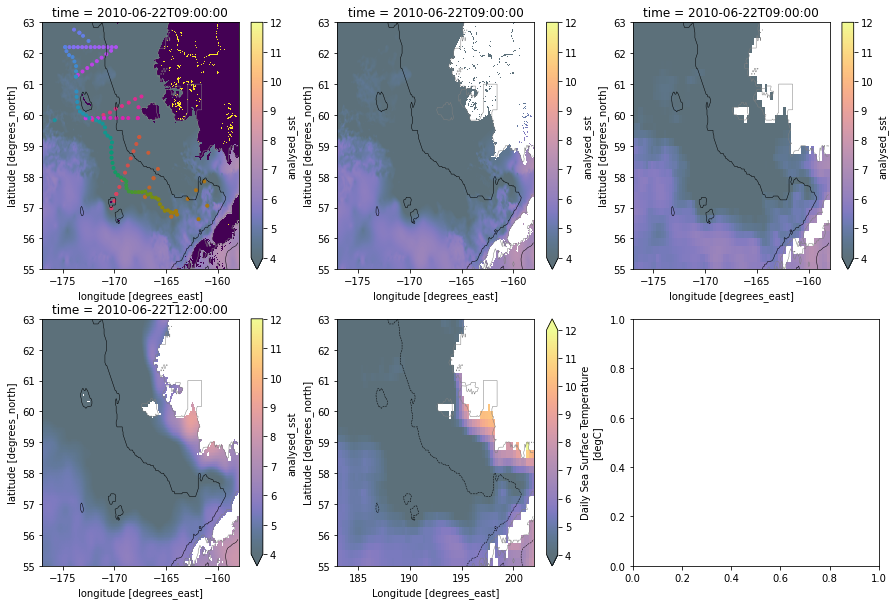

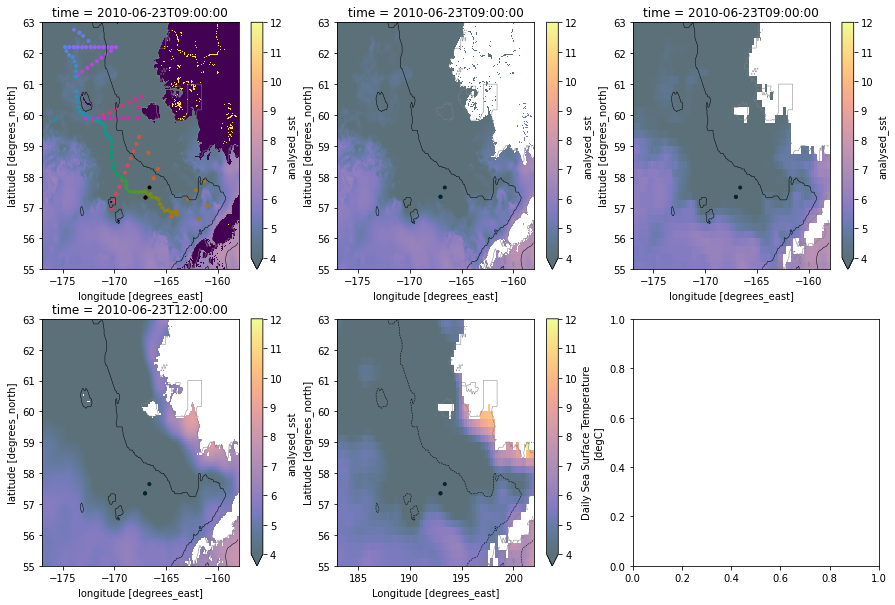

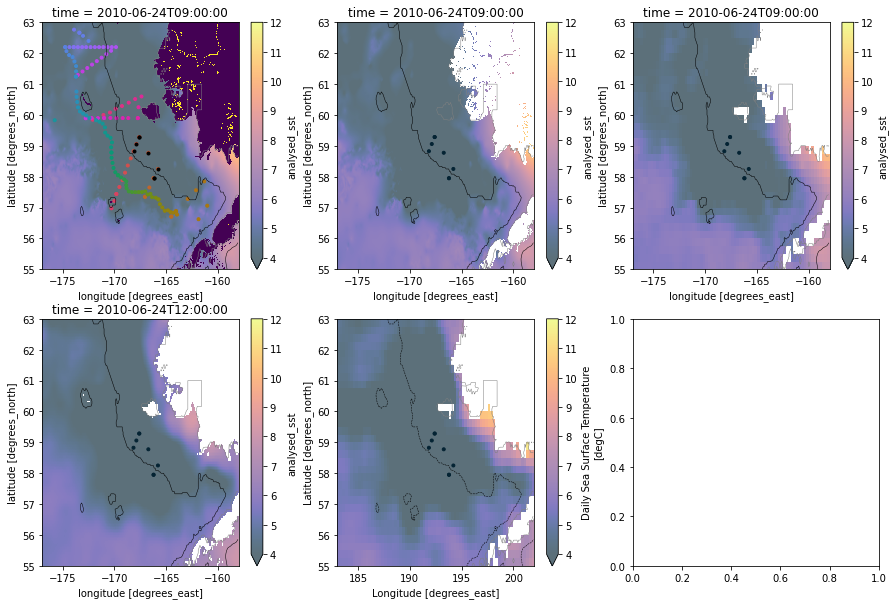

...

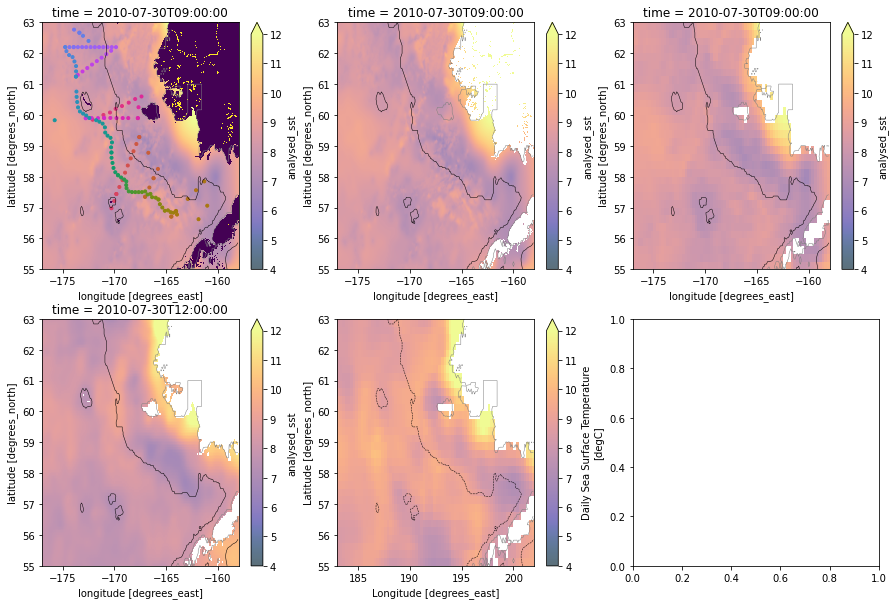

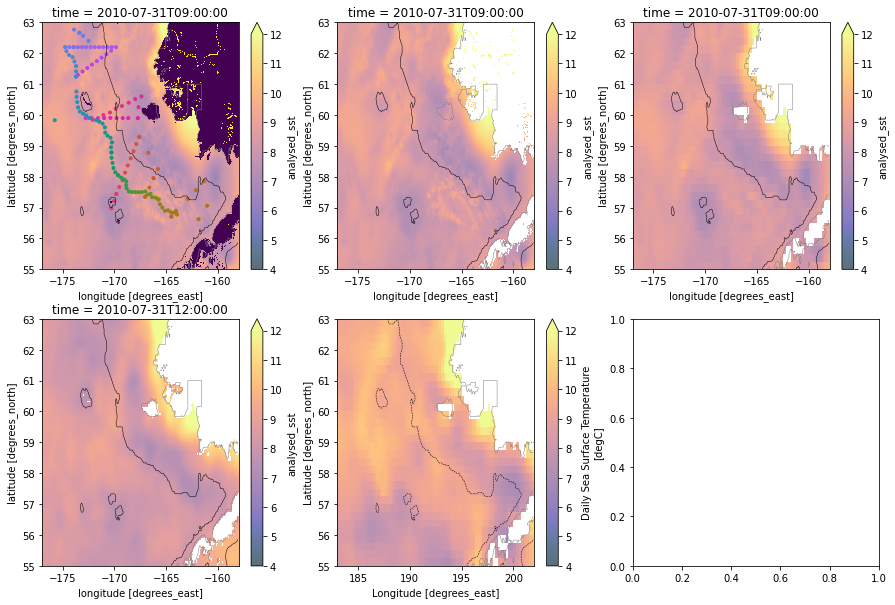

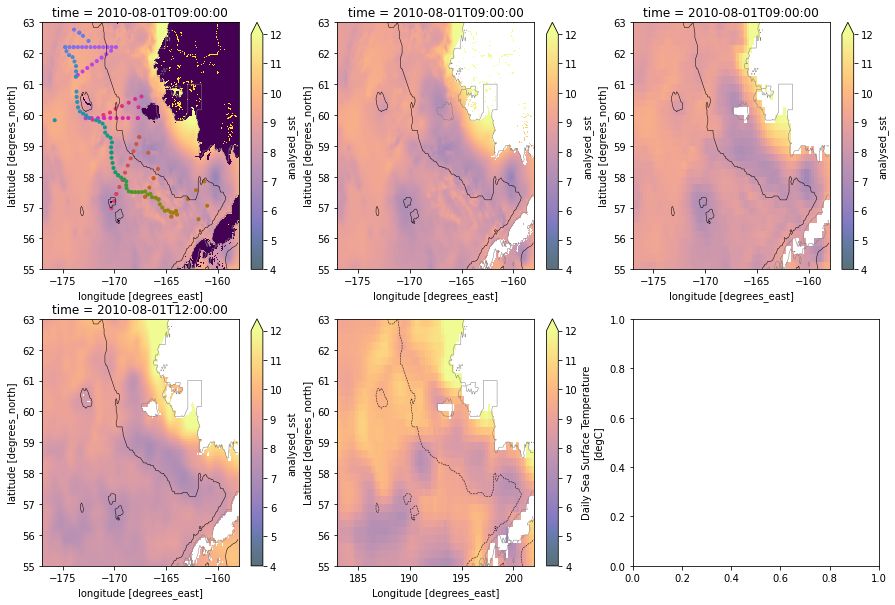

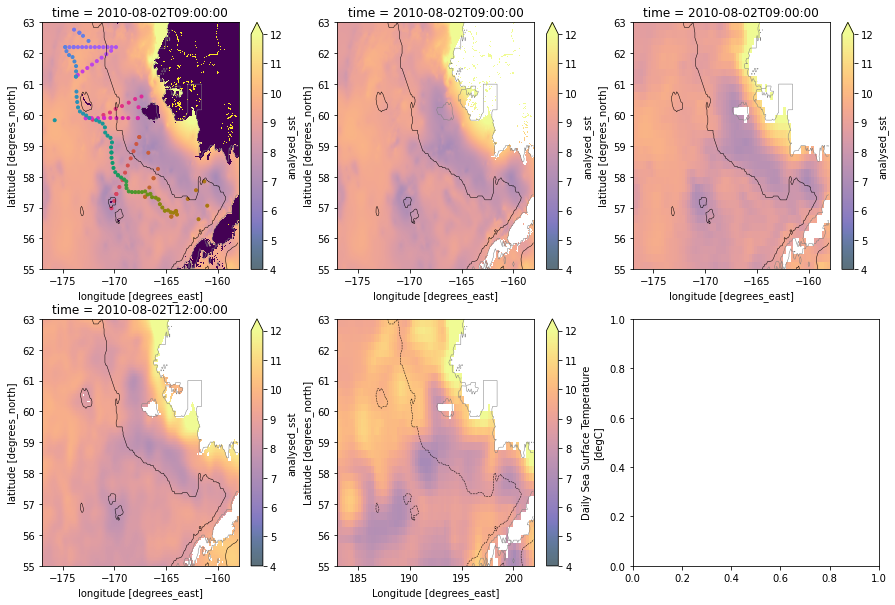

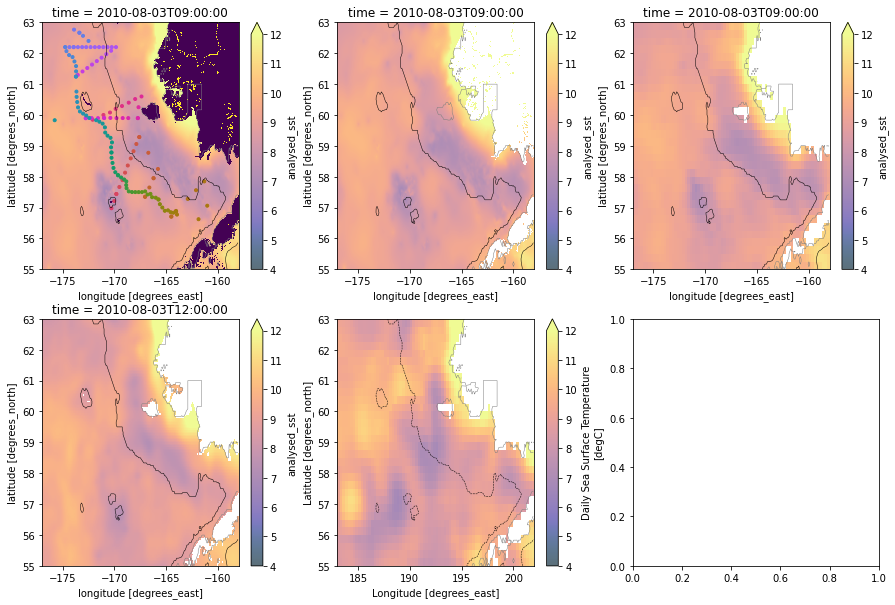

In [48]:
daterange= [datetime.date(2010,6,20) + datetime.timedelta(days=x) for x in range(45)]
for dd in daterange:

    datestr=dd.strftime('%Y-%m-%d')

    fig, ax = plt.subplots(2,3,figsize=(15, 10))

    (mdf_hres.sel(time=slice(datestr, datestr),
                 lat=slice(55,63),
                 lon=slice(-177,-158))['analysed_sst']-273.15).plot(ax=ax[0,0],cmap=cmocean.cm.thermal,vmax=12,vmin=4,alpha=0.65)

    (mdf_hres.sel(time=slice(datestr, datestr),
                 lat=slice(55,63),
                 lon=slice(-177,-158))['mask']).where(mdf_hres['mask']!=1).plot(ax=ax[0,0], add_colorbar=False)

    (mdf_hres.sel(time=slice(datestr, datestr),
                 lat=slice(55,63),
                 lon=slice(-177,-158))['analysed_sst']-273.15).plot(ax=ax[0,1],cmap=cmocean.cm.thermal,vmax=12,vmin=4,alpha=0.65)

    (mdf.sel(time=slice(datestr, datestr),
                 lat=slice(55,63),
                 lon=slice(-177,-158))['analysed_sst']-273.15).plot(ax=ax[0,2],cmap=cmocean.cm.thermal,vmax=12,vmin=4,alpha=0.65)


    (ukdf_hres.sel(time=slice(datestr, datestr),
                 lat=slice(55,63),
                 lon=slice(-177,-158))['analysed_sst']-273.15).plot(ax=ax[1,0],cmap=cmocean.cm.thermal,vmax=12,vmin=4,alpha=0.65)

    subplotset = ctddata[ctddata['date'] == datestr]

    (xdf.sel(time=slice(datestr, datestr),
                 lat=slice(55,63),
                 lon=slice(183,202))['sst']).plot(ax=ax[1,1],cmap=cmocean.cm.thermal,vmax=12,vmin=4,alpha=0.65)

    ax[1,0].scatter(x=-1*(360-subplotset.lon),y=subplotset.lat,c=subplotset['T_28 top'],marker='.',cmap=cmocean.cm.thermal,vmax=12,vmin=4)
    ax[1,1].scatter(x=subplotset.lon,y=subplotset.lat,c=subplotset['T_28 top'],marker='.',cmap=cmocean.cm.thermal,vmax=12,vmin=4)
    ax[0,1].scatter(x=-1*(360-subplotset.lon),y=subplotset.lat,c=subplotset['T_28 top'],marker='.',cmap=cmocean.cm.thermal,vmax=12,vmin=4)
    ax[0,2].scatter(x=-1*(360-subplotset.lon),y=subplotset.lat,c=subplotset['T_28 top'],marker='.',cmap=cmocean.cm.thermal,vmax=12,vmin=4)

    cm1 =ax[0,0].scatter(x=-1*(360-ctddata.lon),y=ctddata.lat,c=ctddata.index,marker='.',cmap=cmocean.cm.phase)
    cm1 =ax[0,0].scatter(x=-1*(360-subplotset.lon),y=subplotset.lat,marker='.',color='k')
    
    
    #add 50m line

    ax[0,0].contour(-1*(360-bathy_sub.longitude),bathy_sub.latitude,bathy_sub['ROSE'],
                    levels=[-50,0],colors=['k','grey'],linewidths=0.5)
    ax[0,1].contour(-1*(360-bathy_sub.longitude),bathy_sub.latitude,bathy_sub['ROSE'],
                    levels=[-50,0],colors=['k','grey'],linewidths=0.5)
    ax[0,2].contour(-1*(360-bathy_sub.longitude),bathy_sub.latitude,bathy_sub['ROSE'],
                    levels=[-50,0],colors=['k','grey'],linewidths=0.5)
    ax[1,0].contour(-1*(360-bathy_sub.longitude),bathy_sub.latitude,bathy_sub['ROSE'],
                    levels=[-50,0],colors=['k','grey'],linewidths=0.5)
    bathy_sub.ROSE.plot.contour(levels=[0,-50],ax=ax[1,1],colors=['k','grey'],linewidths=0.5)
    plt.savefig(datestr+'.png',dpi=300)



Beyond the obvious resolution enhancements... Highres data has values at Nunivak? but low res does not (none of these are masked... so maybe that will help?).  Differences we se above are when casts are near Nunivak (in that colder region.  But look at the Coastal region near the kuskikwim or bristol bay... way different.

Data ingested? AMSR-E, 

Both sets are available in near real time (as is the UKmet data)

![AVHRR Pathfinder](https://coastwatch.pfeg.noaa.gov/erddap/griddap/nceiPH53sstd1day.png?sea_surface_temperature%5B(2010-07-08T12:00:00Z)%5D%5B(62.02072):(55.02073)%5D%5B(-170.0207):(-158.0207)%5D&.draw=surface&.vars=longitude%7Clatitude%7Csea_surface_temperature&.colorBar=KT_thermal%7C%7C%7C4%7C12%7C&.bgColor=0xffccccff)

![UKMet](https://coastwatch.pfeg.noaa.gov/erddap/griddap/jplUKMO_OSTIAv20.png?analysed_sst%5B(2010-07-08T12:00:00Z)%5D%5B(55.025):(62.025)%5D%5B(-169.975):(-157.975)%5D&.draw=surface&.vars=longitude%7Clatitude%7Canalysed_sst&.colorBar=KT_thermal%7C%7C%7C4%7C12%7C&.bgColor=0xffccccff)

In [23]:
# pull NARR data
windfiles = '/Volumes/MobileSSD/in_and_outbox/data_sets/reanalyis_data/NARR/subset/'
m2narrdf = xa.open_mfdataset(windfiles+'NARR_M2*.cf.nc')
ifnarrdf = xa.open_mfdataset(windfiles+'NARR_IF*.cf.nc')
kdnarrdf = xa.open_mfdataset(windfiles+'NARR_KD*.cf.nc')
m2_ws = np.sqrt(m2narrdf.WU_422**2 + m2narrdf.WV_423**2)
if_ws = np.sqrt(ifnarrdf.WU_422**2 + ifnarrdf.WV_423**2)
kd_ws = np.sqrt(kdnarrdf.WU_422**2 + kdnarrdf.WV_423**2)

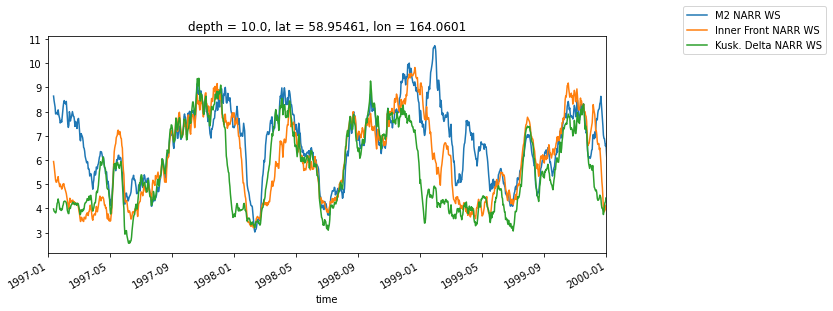

In [24]:
fig, ax = plt.subplots(figsize=(10, 4))


m2_ws.rolling(time=21, center=True).mean().plot(ax=ax, label='M2 NARR WS')
if_ws.rolling(time=21, center=True).mean().plot(ax=ax, label='Inner Front NARR WS')
kd_ws.rolling(time=21, center=True).mean().plot(ax=ax, label='Kusk. Delta NARR WS')

plt.xlim([datetime.date(1997,1,1),datetime.date(2000,1,1)])

fig.legend(bbox_to_anchor=(1,1), loc="upper left")

In [24]:
# pull april 1,15 may 1,15 SST (and ice?) out at each station for all years (June & July 1)
sstfiles = '/Volumes/MobileSSD/in_and_outbox/data_sets/noaa.oisst.v2.highres/'
xdf = xa.open_mfdataset(sstfiles+'sst.day.mean.2*.v2.nc')
m2df = xdf.sel(lat=m2point[0], lon=m2point[1], method="nearest").load()
mdf = xdf.sel(lat=ifpoint[0], lon=ifpoint[1], method="nearest").load()
kdf = xdf.sel(lat=kpoint[0], lon=kpoint[1], method="nearest").load()

## if
NOAAsst_yoydf = kdf.sel(time=(((kdf.time.dt.month==4) | (kdf.time.dt.month==5) | (kdf.time.dt.month==6) | (kdf.time.dt.month==7)) & 
                              ((kdf.time.dt.day==1) | (kdf.time.dt.day==15)))).to_dataframe().drop(['lat','lon'],axis=1)
NOAAsst_yoydf = pd.concat([NOAAsst_yoydf,m2df.sel(time=(((m2df.time.dt.month==4) | (m2df.time.dt.month==5) | (m2df.time.dt.month==6) | (m2df.time.dt.month==7)) & 
                                                        ((m2df.time.dt.day==1) | (m2df.time.dt.day==15)))).to_dataframe().drop(['lat','lon'],axis=1)],axis=1)
NOAAsst_yoydf =pd.concat([NOAAsst_yoydf,mdf.sel(time=(((mdf.time.dt.month==4) | (mdf.time.dt.month==5) | (mdf.time.dt.month==6) | (mdf.time.dt.month==7)) & 
                                                      ((mdf.time.dt.day==1) | (mdf.time.dt.day==15)))).to_dataframe().drop(['lat','lon'],axis=1)],axis=1)

In [25]:
# pull april 1,15 may 1,15 SST (and ice?) out at each station for all years
xidf = xa.open_mfdataset(sstfiles+'icec.day.mean.2*.v2.nc')
m2df = xidf.sel(lat=m2point[0], lon=m2point[1], method="nearest").load()
mdf = xidf.sel(lat=ifpoint[0], lon=ifpoint[1], method="nearest").load()
kdf = xidf.sel(lat=kpoint[0], lon=kpoint[1], method="nearest").load()

## if
NOAAicec_yoydf = kdf.sel(time=(((kdf.time.dt.month==4) | (kdf.time.dt.month==5) | (kdf.time.dt.month==6) | (kdf.time.dt.month==7)) & 
                              ((kdf.time.dt.day==1) | (kdf.time.dt.day==15)))).to_dataframe().drop(['lat','lon'],axis=1)
NOAAicec_yoydf = pd.concat([NOAAicec_yoydf,m2df.sel(time=(((m2df.time.dt.month==4) | (m2df.time.dt.month==5) | (m2df.time.dt.month==6) | (m2df.time.dt.month==7)) & 
                                                        ((m2df.time.dt.day==1) | (m2df.time.dt.day==15)))).to_dataframe().drop(['lat','lon'],axis=1)],axis=1)
NOAAicec_yoydf =pd.concat([NOAAicec_yoydf,mdf.sel(time=(((mdf.time.dt.month==4) | (mdf.time.dt.month==5) | (mdf.time.dt.month==6) | (mdf.time.dt.month==7)) & 
                                                      ((mdf.time.dt.day==1) | (mdf.time.dt.day==15)))).to_dataframe().drop(['lat','lon'],axis=1)],axis=1)

(-2.0, 15.0)

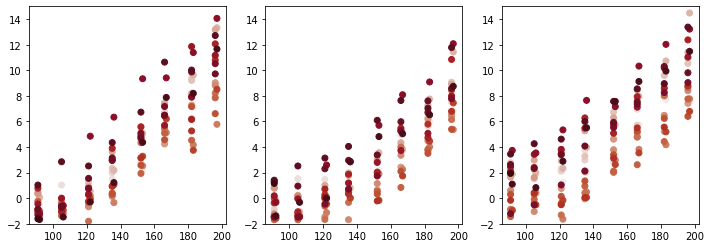

In [26]:
NOAAsst_yoydf['doy'] = NOAAsst_yoydf.index.dayofyear
NOAAsst_yoydf['isleap'] = NOAAsst_yoydf.index.is_leap_year

NOAAsst_yoydf.columns = ['kd_sst','m2_sst','if_sst','doy','isleap']

fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(12, 4))
ax1.scatter(x=NOAAsst_yoydf.index.dayofyear,
            y=NOAAsst_yoydf.kd_sst,
            c=NOAAsst_yoydf.index.year, cmap=cmocean.cm.amp,label='Kusk. Delta')
ax1.set_ylim([-2,15])
ax2.scatter(x=NOAAsst_yoydf.index.dayofyear,
            y=NOAAsst_yoydf.if_sst,
            c=NOAAsst_yoydf.index.year, cmap=cmocean.cm.amp)
ax2.set_ylim([-2,15])
ax3.scatter(x=NOAAsst_yoydf.index.dayofyear,
            y=NOAAsst_yoydf.m2_sst,
            c=NOAAsst_yoydf.index.year, cmap=cmocean.cm.amp)

ax3.set_ylim([-2,15])


(-2.0, 15.0)

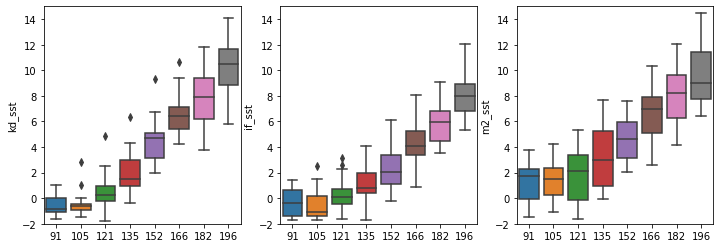

In [27]:
fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(12, 4))
sns.boxplot(x=(NOAAsst_yoydf.doy-NOAAsst_yoydf.isleap), y=NOAAsst_yoydf["kd_sst"],ax=ax1);
sns.boxplot(x=(NOAAsst_yoydf.doy-NOAAsst_yoydf.isleap), y=NOAAsst_yoydf["if_sst"],ax=ax2);
sns.boxplot(x=(NOAAsst_yoydf.doy-NOAAsst_yoydf.isleap), y=NOAAsst_yoydf["m2_sst"],ax=ax3);
ax1.set_ylim([-2,15])
ax2.set_ylim([-2,15])
ax3.set_ylim([-2,15])


In [28]:
# pull april 1,15 may 1,15 SST (and ice?) out at each station for all years
sstfiles = '/Volumes/MobileSSD/in_and_outbox/data_sets/podaac_MUR/SEBering/'
murdf = xa.open_mfdataset(sstfiles+'20*.nc')

m2df = murdf.sel(lat=m2point[0], lon=-1*(180+(180-m2point[1])), method="nearest").load()
mdf = murdf.sel(lat=ifpoint[0], lon=-1*(180+(180-ifpoint[1])), method="nearest").load()
kdf = murdf.sel(lat=kpoint[0], lon=-1*(180+(180-kpoint[1])), method="nearest").load()

## if
MURsst_yoydf = kdf.sel(time=(((kdf.time.dt.month==4) | (kdf.time.dt.month==5) | (kdf.time.dt.month==6) | (kdf.time.dt.month==7)) & 
                             ((kdf.time.dt.day==1) | (kdf.time.dt.day==15)))).to_dataframe().drop(['lat','lon'],axis=1)
MURsst_yoydf = pd.concat([MURsst_yoydf,m2df.sel(time=(((m2df.time.dt.month==4) | (m2df.time.dt.month==5) | (m2df.time.dt.month==6) | (m2df.time.dt.month==7)) &
                             ((m2df.time.dt.day==1) | (m2df.time.dt.day==15)))).to_dataframe().drop(['lat','lon'],axis=1)],axis=1)
MURsst_yoydf =pd.concat([MURsst_yoydf,mdf.sel(time=(((mdf.time.dt.month==4) | (mdf.time.dt.month==5) | (mdf.time.dt.month==6) | (m2df.time.dt.month==7)) &
                             ((mdf.time.dt.day==1) | (mdf.time.dt.day==15)))).to_dataframe().drop(['lat','lon'],axis=1)],axis=1)

In [29]:
MURsst_yoydf = MURsst_yoydf.drop(['analysis_error','mask','sst_anomaly'],axis=1)

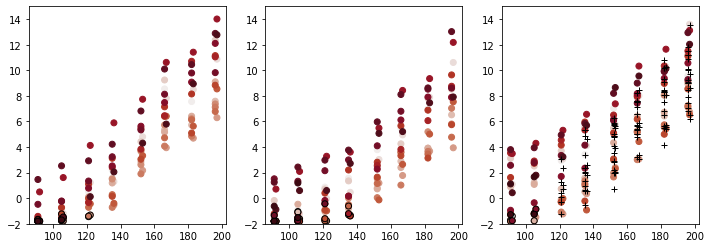

In [30]:
MURsst_yoydf['doy'] = MURsst_yoydf.index.dayofyear
MURsst_yoydf['isleap'] = MURsst_yoydf.index.is_leap_year

MURsst_yoydf.columns = ['kd_sst','kd_ice','m2_sst','m2_ice','if_sst','if_ice','doy','isleap']

fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(12, 4))
ax1.scatter(x=MURsst_yoydf.index.dayofyear,
            y=MURsst_yoydf.kd_sst - 273.15,
            c=MURsst_yoydf.index.year, cmap=cmocean.cm.amp,label='Kusk. Delta')
ax1.scatter(x=MURsst_yoydf[MURsst_yoydf.kd_ice > .15].index.dayofyear,
            y=MURsst_yoydf[MURsst_yoydf.kd_ice > .15].kd_sst - 273.15,
            c=MURsst_yoydf[MURsst_yoydf.kd_ice > .15].index.year, cmap=cmocean.cm.amp,edgecolors='k') 
ax1.set_ylim([-2,15])
ax2.scatter(x=MURsst_yoydf.index.dayofyear,
            y=MURsst_yoydf.if_sst - 273.15,
            c=MURsst_yoydf.index.year, cmap=cmocean.cm.amp)
ax2.scatter(x=MURsst_yoydf[MURsst_yoydf.if_ice > .15].index.dayofyear,
            y=MURsst_yoydf[MURsst_yoydf.if_ice > .15].if_sst - 273.15,
            c=MURsst_yoydf[MURsst_yoydf.if_ice > .15].index.year, cmap=cmocean.cm.amp,edgecolors='k') 
ax2.set_ylim([-2,15])

ax3.scatter(x=MURsst_yoydf.index.dayofyear,
            y=MURsst_yoydf.m2_sst - 273.15,
            c=MURsst_yoydf.index.year, cmap=cmocean.cm.amp)
ax3.scatter(x=MURsst_yoydf[MURsst_yoydf.m2_ice > .15].index.dayofyear,
            y=MURsst_yoydf[MURsst_yoydf.m2_ice > .15].m2_sst - 273.15,
            c=MURsst_yoydf[MURsst_yoydf.m2_ice > .15].index.year, cmap=cmocean.cm.amp,edgecolors='k') 
ax3.set_ylim([-2,15])

    

for dataset_id in sorted(dfm2.keys(),reverse=True):
    try:
        btmdepth = min(dfm2[dataset_id].groupby('depth').groups.keys())
        if btmdepth <1:
            btmdepth = min(list(dfm2[dataset_id].groupby('depth').groups.keys())[1:])

        nd = ((dfm2[dataset_id][dfm2[dataset_id].depth == btmdepth])['temperature'].resample('1D').mean())
        ax3.plot(nd[(((nd.index.month==4) | (nd.index.month==5) | (nd.index.month==6) | (nd.index.month==7)) & ((nd.index.day==1) | (nd.index.day==15)))].index.dayofyear,
                    nd[(((nd.index.month==4) | (nd.index.month==5) | (nd.index.month==6) | (nd.index.month==7)) & ((nd.index.day==1) | (nd.index.day==15)))],'k+')
    except:
        pass

(-2.0, 15.0)

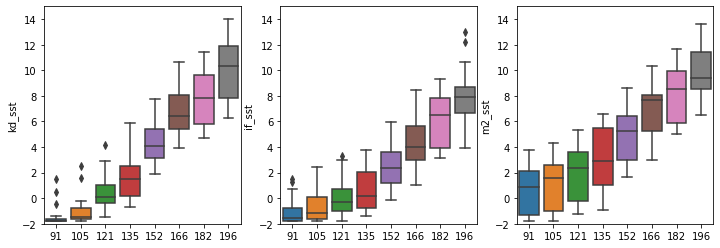

In [31]:

fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(12, 4))
sns.boxplot(x=(MURsst_yoydf.doy-MURsst_yoydf.isleap), y=MURsst_yoydf["kd_sst"]-273.15,ax=ax1);
sns.boxplot(x=(MURsst_yoydf.doy-MURsst_yoydf.isleap), y=MURsst_yoydf["if_sst"]-273.15,ax=ax2);
sns.boxplot(x=(MURsst_yoydf.doy-MURsst_yoydf.isleap), y=MURsst_yoydf["m2_sst"]-273.15,ax=ax3);
ax1.set_ylim([-2,15])
ax2.set_ylim([-2,15])
ax3.set_ylim([-2,15])


## Next Steps

Simple Linear Reg model? or Categorical Model?

If modeling we have (regression vs categorical… past to predict present or features to predict category):
+ top/bottom SST (use delta-t to specify 1 layer vs two layer : Class)
+ Sat SST, IceConc
+ NARR Winds
+ Test model at CTD locations / Moored locations / for certain times of year
+ Bottom Depth


- ~Add 50m Isobath~
- ~make movie of CTD vs SST (M8 to M2 to Bristol Bay)~
- ~April 1, April 15, May 1, May 15 (year over year, and ice flag?)~
- filter instead of average the temperature on mooring data (or get the std <.1)
- ~NARR winds at IF and KB~
- ADCP overwinter temperature (97-98) : **record ends in December**